<a href="https://colab.research.google.com/github/TmKarter/GAN_education/blob/master/adv_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
from torch.nn.functional import leaky_relu, relu, dropout

import os, time
import torch.optim as optim
from torchvision import transforms

### Архитектура генератора(U-net) и дискриминатора:

In [ ]:
class generator(nn.Module):
    # initializers
    def __init__(self):
        super(generator, self).__init__()
        
        # блок слоев энкодера
        self.enc_conv1 = nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1)
        self.enc_conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.el2_bn = nn.BatchNorm2d(128)
        self.enc_conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.el3_bn = nn.BatchNorm2d(256)
        self.enc_conv4 = nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1)
        self.el4_bn = nn.BatchNorm2d(512)
        self.enc_conv5 = nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1)
        self.el5_bn = nn.BatchNorm2d(512)
        self.enc_conv6 = nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1)
        self.el6_bn = nn.BatchNorm2d(512)
        self.enc_conv7 = nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1)
        self.el7_bn = nn.BatchNorm2d(512)
        self.enc_conv8 = nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1)
        self.el8_bn = nn.BatchNorm2d(512)

        # блок слоев декодера
        self.de_conv1 = nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1)
        self.dl1_bn = nn.BatchNorm2d(512)
        self.de_conv2 = nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1)
        self.dl2_bn = nn.BatchNorm2d(512)
        self.de_conv3 = nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1)
        self.dl3_bn = nn.BatchNorm2d(512)
        self.de_conv4 = nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1)
        self.dl4_bn = nn.BatchNorm2d(512)
        self.de_conv5 = nn.ConvTranspose2d(1024, 256, kernel_size=4, stride=2, padding=1)
        self.dl5_bn = nn.BatchNorm2d(256)
        self.de_conv6 = nn.ConvTranspose2d(512, 128, kernel_size=4, stride=2, padding=1)
        self.dl6_bn = nn.BatchNorm2d(128)
        self.de_conv7 = nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1)
        self.dl7_bn = nn.BatchNorm2d(64)
        self.de_conv8 = nn.ConvTranspose2d(128, 3, kernel_size=4, stride=2, padding=1)

    # # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        e1 = self.enc_conv1(input)
        e2 = self.el2_bn(self.enc_conv2(leaky_relu(e1, 0.2)))
        e3 = self.el3_bn(self.enc_conv3(leaky_relu(e2, 0.2)))
        e4 = self.el4_bn(self.enc_conv4(leaky_relu(e3, 0.2)))
        e5 = self.el5_bn(self.enc_conv5(leaky_relu(e4, 0.2)))
        e6 = self.el6_bn(self.enc_conv6(leaky_relu(e5, 0.2)))
        e7 = self.el7_bn(self.enc_conv7(leaky_relu(e6, 0.2)))
        e8 = self.el8_bn(self.enc_conv8(leaky_relu(e7, 0.2)))

        d1 = dropout(self.dl1_bn(self.de_conv1(relu(e8))), 0.5, training=True)
        d1 = torch.cat([d1, e7], 1)
        d2 = dropout(self.dl2_bn(self.de_conv2(relu(d1))), 0.5, training=True)
        d2 = torch.cat([d2, e6], 1)
        d3 = dropout(self.dl3_bn(self.de_conv3(relu(d2))), 0.5, training=True)
        d3 = torch.cat([d3, e5], 1)
        d4 = self.dl4_bn(self.de_conv4(relu(d3)))
        d4 = torch.cat([d4, e4], 1)
        d5 = self.dl5_bn(self.de_conv5(relu(d4)))
        d5 = torch.cat([d5, e3], 1)
        d6 = self.dl6_bn(self.de_conv6(relu(d5)))
        d6 = torch.cat([d6, e2], 1)
        d7 = self.dl7_bn(self.de_conv7(relu(d6)))
        d7 = torch.cat([d7, e1], 1)
        d8 = self.de_conv8(relu(d7))
        out = torch.tanh(d8)

        return out

class discriminator(nn.Module):
    # initializers
    def __init__(self):
        super(discriminator, self).__init__()
        self.conv1 = nn.Conv2d(6, 64, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.l2_bn = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.l3_bn = nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1) # stride == 1?
        self.l4_bn = nn.BatchNorm2d(512)
        self.conv5 = nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input, label):
        x = torch.cat([input, label], 1)
        x = leaky_relu(self.conv1(x), 0.2)
        x = leaky_relu(self.l2_bn(self.conv2(x)), 0.2)
        x = leaky_relu(self.l3_bn(self.conv3(x)), 0.2)
        x = leaky_relu(self.l4_bn(self.conv4(x)), 0.2)
        out = torch.sigmoid(self.conv5(x))

        return out

def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

### Используемый датасет - фасад

In [ ]:
import subprocess
import tarfile


bashCommand = "wget https://people.eecs.berkeley.edu/~tinghuiz/projects/pix2pix/datasets/facades.tar.gz"
process = subprocess.Popen(bashCommand.split(), stdout=subprocess.PIPE)
process.wait()

0

In [ ]:
fname = 'facades.tar.gz'
tar = tarfile.open(fname, "r:gz")
tar.extractall()
tar.close()

In [ ]:
from torch.utils import data
from os.path import join

# data_loader
my_transform = transforms.Compose([
        transforms.Resize(256),                        
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

BATCH_SIZE = 4
VAL_BATCH_SIZE=4
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class Castom_Dataset(data.Dataset):
    def __init__(self, data_root, mode, transform):
        self.root_dir = join(data_root, mode)
        list_paths = []
        for item in os.listdir(self.root_dir):
            list_paths.append(join(self.root_dir, item))
        
        self.data = sorted(list_paths)
        self.transformation = transform

    def __getitem__(self, ind):
        cur_image = Image.open(self.data[ind]).convert('RGB')

        image_1 = self.transformation(
            cur_image.crop(box=(0, 0, int(cur_image.size[0] / 2), cur_image.size[1])))
        
        image_2 = self.transformation(
            cur_image.crop((int(cur_image.size[0] / 2), 0, cur_image.size[0], cur_image.size[1])))
        
        return image_2, image_1 # у фасадов лейблы в другом порядке

    def __len__(self):
        return len(self.data)

data_set_train = Castom_Dataset("facades", "train", my_transform)
data_set_val = Castom_Dataset("facades", "val", my_transform)
loader_val = data.DataLoader(data_set_val, batch_size=VAL_BATCH_SIZE, shuffle=False)
loader_train = data.DataLoader(data_set_train, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
# network
G = generator()
D = discriminator()
G.weight_init(mean=0.0, std=0.02)
D.weight_init(mean=0.0, std=0.02)
G.cuda()
D.cuda()
G.train()
D.train()

# loss
BCE_loss = nn.BCELoss().cuda()
L1_loss = nn.L1Loss().cuda()

# Adam optimizer
G_optimizer = optim.Adam(G.parameters(), lr=0.0001, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr=0.0001, betas=(0.5, 0.999))

In [ ]:
train_hist = {'D_loss': [], 'D_l_fake': [], 'D_l_real': [],
              'G_loss': [], 'G_l_l1':[]}

val_hist = {'D_loss': [], 'D_l_fake': [], 'D_l_real': [],
              'G_loss': [], 'G_l_l1':[]}

In [ ]:
from tqdm.auto import tqdm
from PIL import Image
from IPython.display import clear_output

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def show_result(G, loader_val, epoch_cur):
    outlines = []
    target = []
    predict = []

    G.eval()
    batch_1, batch_2 = next(iter(loader_val))

    fake_2 = G(batch_1[:5,:,:,:].cuda())
    outlines = batch_1
    target = batch_2[:5,:,:,:]
    predict = fake_2.cpu()

    #clear_output(wait = True)
    for i in range(predict.shape[0]):
        concat_image = (torch.cat([outlines[i], predict[i], target[i]], dim=-1) + 1.) / 2.
        plt.imshow(np.transpose(concat_image.detach().numpy(), (1,2,0)))
        # plt.savefig('./res_pic/' +'num' + str(i) + '_epoch_' + str(epoch_cur) + '.png')
        plt.show()

### Основной блок обучения:

In [ ]:
start_epoch = 0
end_epoch = 500
L1_lambda = 100

for epoch in range(start_epoch, end_epoch):
    D_loss = []
    D_l_fake = []
    D_l_real = []

    G_loss = []
    G_l_l1 = []

    for batch_1, batch_2 in tqdm(loader_train):
        D.train()
        G.train()

        # train discriminator D
        D.zero_grad()
        for params in G.parameters(): params.requires_grad = False
        for params in D.parameters(): params.requires_grad = True

        x_, y_ = batch_1.cuda(), batch_2.cuda()

        D_result = D(x_, y_).squeeze()
        D_real_loss = BCE_loss(D_result, torch.ones(D_result.size()).cuda())

        G_result = G(x_)
        D_result = D(x_, G_result).squeeze()
        D_fake_loss = BCE_loss(D_result, torch.zeros(D_result.size()).cuda())

        D_l_fake.append(D_fake_loss.item())
        D_l_real.append(D_real_loss.item())

        D_train_loss = (D_real_loss + D_fake_loss) * 0.5
        D_train_loss.backward()
        D_optimizer.step()

        D_loss.append(D_train_loss.item())

        # train generator G
        G.zero_grad()
        for params in G.parameters(): params.requires_grad = True
        for params in D.parameters(): params.requires_grad = False

        G_result = G(x_)
        D_result = D(x_, G_result).squeeze()
        l1_loss = L1_loss(G_result, y_)
        G_l_l1.append(l1_loss.item())

        G_train_loss = BCE_loss(D_result, torch.ones(D_result.size()).cuda()) + L1_lambda * l1_loss
        G_train_loss.backward()
        G_optimizer.step()

        G_loss.append(G_train_loss.item())

    print('[%d/%d] - loss_d: %.3f, loss_g: %.3f' % (epoch, end_epoch, torch.mean(torch.FloatTensor(D_loss)),
                                                              torch.mean(torch.FloatTensor(G_loss))))
    train_hist['D_loss'].append(np.mean(D_loss))
    train_hist['D_l_fake'].append(np.mean(D_l_fake))
    train_hist['D_l_real'].append(np.mean(D_l_real))
    train_hist['G_l_l1'].append(np.mean(G_l_l1))
    train_hist['G_loss'].append(np.mean(G_loss))
    

    D_loss = []
    D_l_fake = []
    D_l_real = []

    G_loss = []
    G_l_l1 = []
    
    # valid block
    for batch_1, batch_2 in tqdm(loader_val):
        D.eval()
        G.eval()

        x_, y_ = batch_1.cuda(), batch_2.cuda()

        D_result = D(x_, y_).squeeze()
        D_real_loss = BCE_loss(D_result, torch.ones(D_result.size()).cuda())

        G_result = G(x_)
        D_result = D(x_, G_result).squeeze()
        D_fake_loss = BCE_loss(D_result, torch.zeros(D_result.size()).cuda())

        D_l_fake.append(D_fake_loss.item())
        D_l_real.append(D_real_loss.item())

        D_train_loss = (D_real_loss + D_fake_loss) * 0.5
        D_loss.append(D_train_loss.item())


        G_result = G(x_)
        D_result = D(x_, G_result).squeeze()
        l1_loss = L1_loss(G_result, y_)
        G_l_l1.append(l1_loss.item())

        G_train_loss = BCE_loss(D_result, torch.ones(D_result.size()).cuda()) + L1_lambda * l1_loss
        G_loss.append(G_train_loss.item())

    val_hist['D_loss'].append(np.mean(D_loss))
    val_hist['D_l_fake'].append(np.mean(D_l_fake))
    val_hist['D_l_real'].append(np.mean(D_l_real))
    val_hist['G_l_l1'].append(np.mean(G_l_l1))
    val_hist['G_loss'].append(np.mean(G_loss))

    # show result
    if epoch % 10 == 0:
      show_result(G, loader_val, epoch)
    # save_model
    if (epoch + 1) % 50 == 0:
        torch.save({
            'G': G.state_dict(),
            'D': D.state_dict(),
            'G_optim': G_optimizer.state_dict(),
            'D_optim' : D_optimizer.state_dict(),
            'epoch': epoch
        }, f"./drive/MyDrive/gan_l1/DL3model_{epoch}.pth")

### Визуализация полученных лоссов:

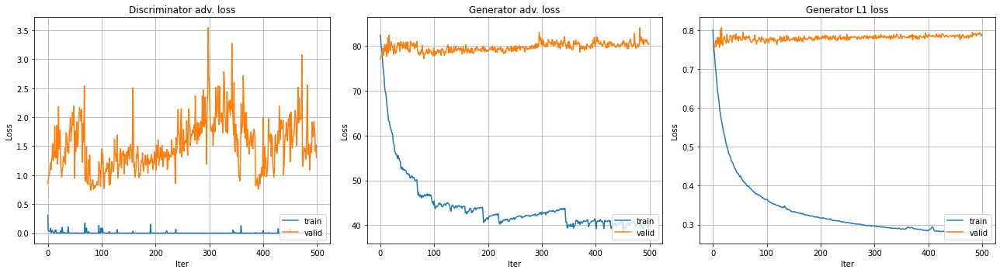

In [ ]:
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)

x = range(len(train_hist['D_loss']))

y1 = train_hist['D_loss']
y2 = val_hist['D_loss']

plt.plot(x, y1, label='train')
plt.plot(x, y2, label='valid')

plt.title('Discriminator adv. loss')
plt.xlabel('Iter')
plt.ylabel('Loss')

plt.legend(loc=4)
plt.grid(True)
plt.tight_layout()

plt.subplot(1, 3, 2)

x = range(len(train_hist['G_loss']))

y1 = train_hist['G_loss']
y2 = val_hist['G_loss']

plt.plot(x, y1, label='train')
plt.plot(x, y2, label='valid')

plt.title('Generator adv. loss')
plt.xlabel('Iter')
plt.ylabel('Loss')

plt.legend(loc=4)
plt.grid(True)
plt.tight_layout()

plt.subplot(1, 3, 3)
x = range(len(train_hist['G_l_l1']))

y1 = train_hist['G_l_l1']
y2 = val_hist['G_l_l1']

plt.plot(x, y1, label='train')
plt.plot(x, y2, label='valid')

plt.title('Generator L1 loss')
plt.xlabel('Iter')
plt.ylabel('Loss')
plt.legend(loc=4)
plt.grid(True)
plt.tight_layout()

plt.show()

## Результаты обучения (маска, генерация модели, таргет):

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


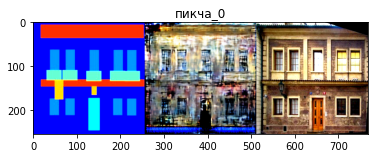

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


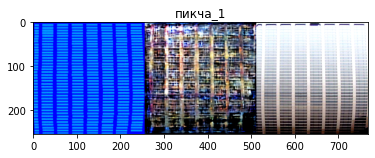

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


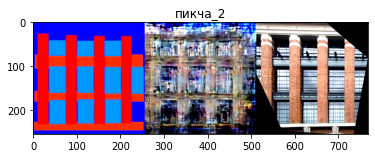

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


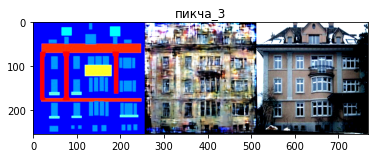

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


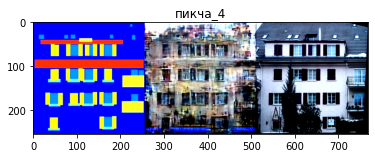

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


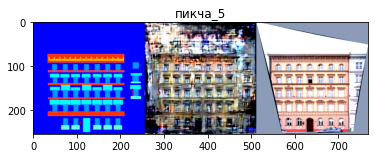

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


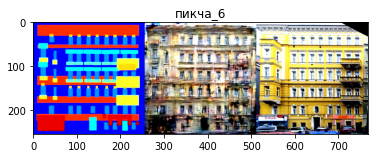

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


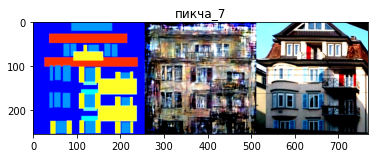

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


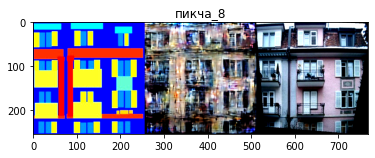

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


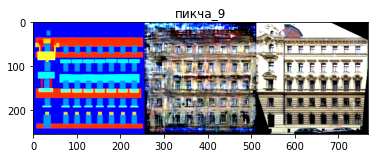

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


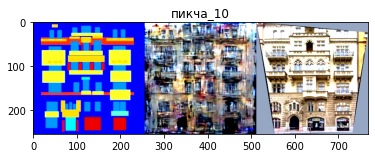

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


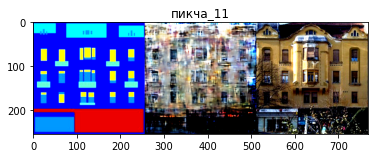

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


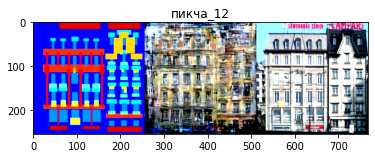

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


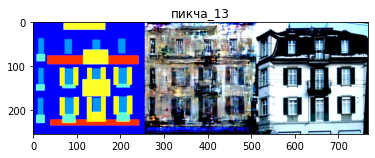

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


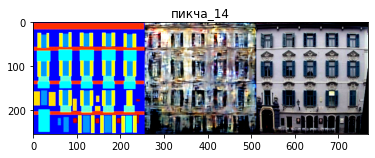

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


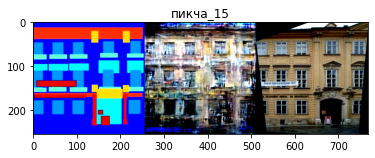

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


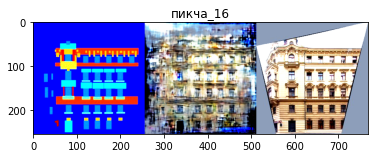

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


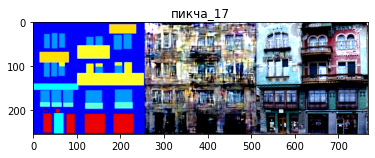

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


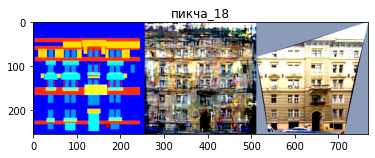

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


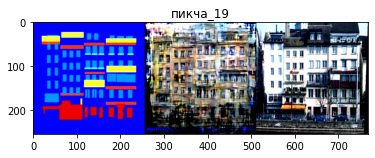

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


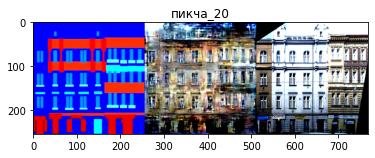

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


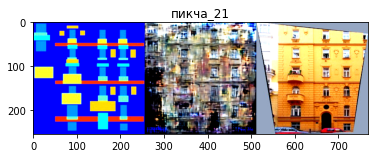

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


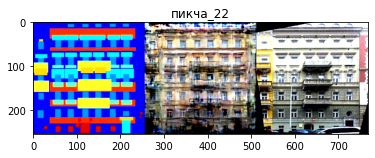

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


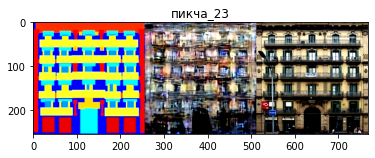

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


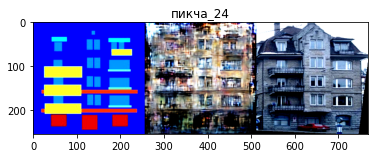

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


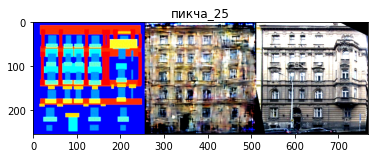

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


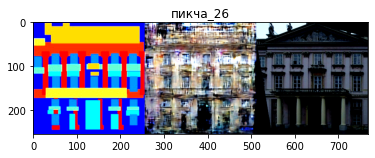

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


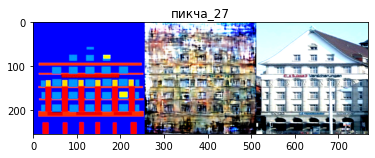

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


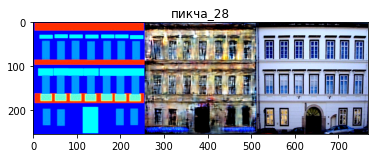

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


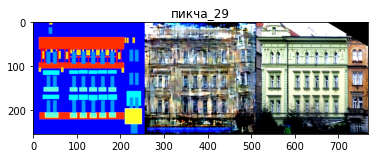

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


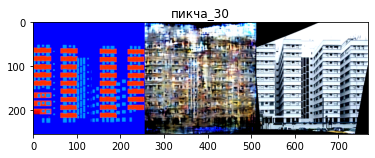

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


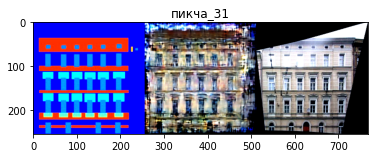

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


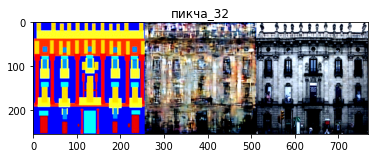

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


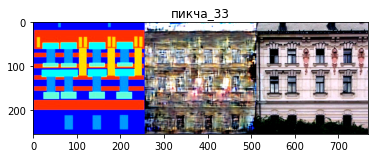

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


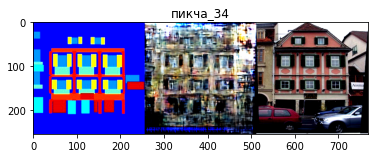

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


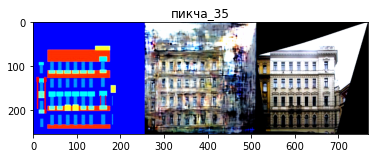

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


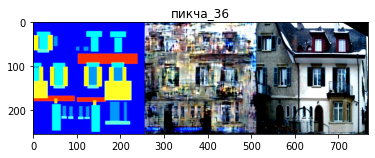

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


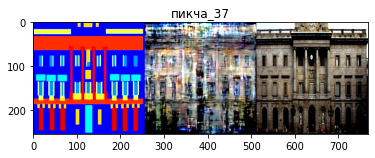

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


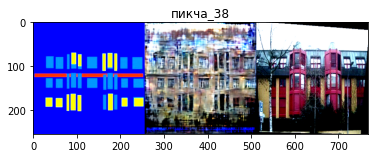

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


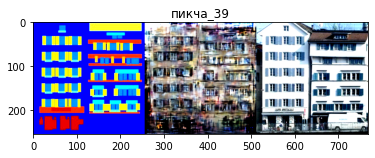

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


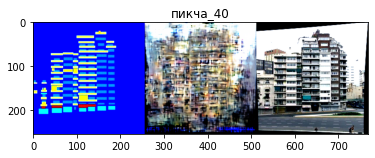

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


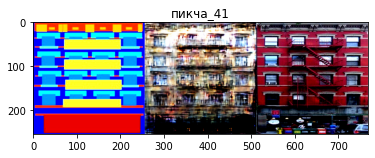

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


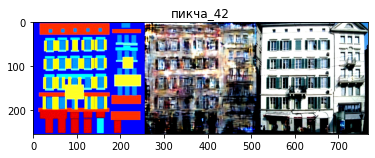

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


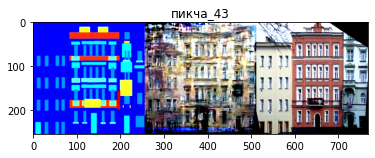

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


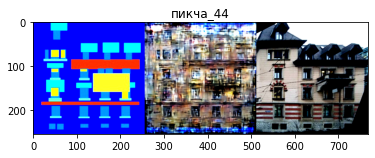

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


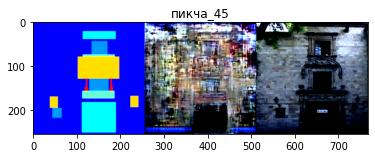

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


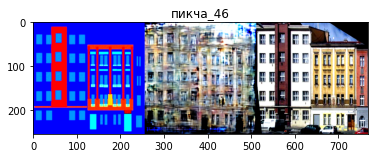

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


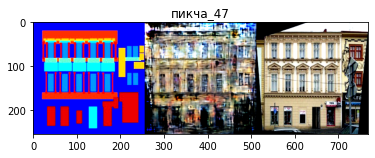

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


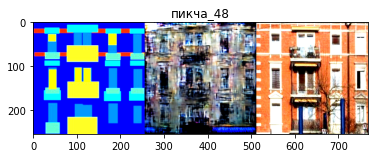

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


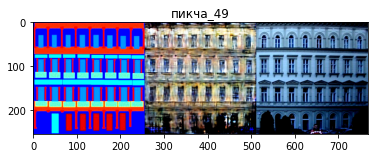

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


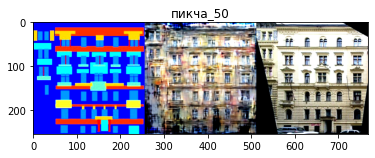

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


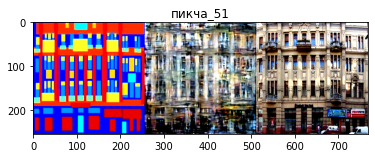

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


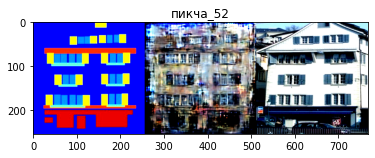

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


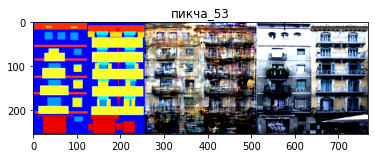

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


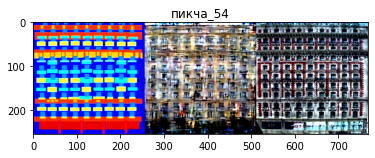

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


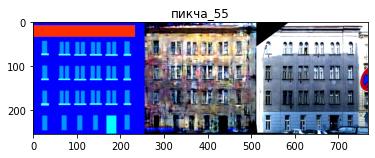

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


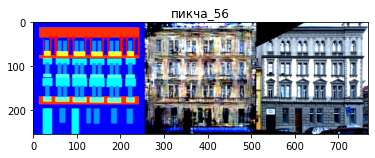

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


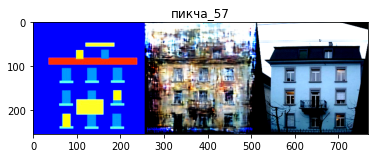

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


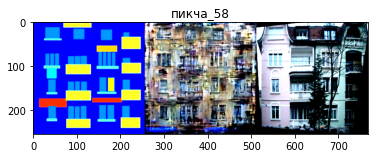

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


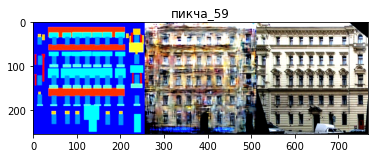

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


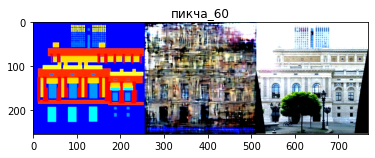

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


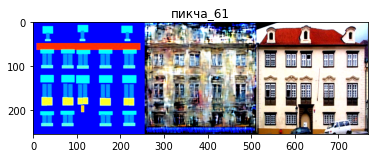

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


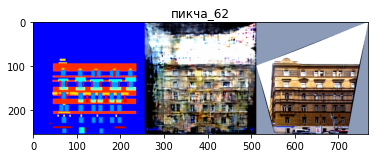

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


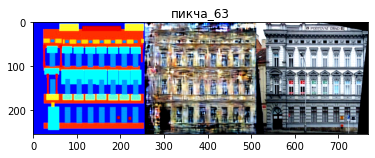

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


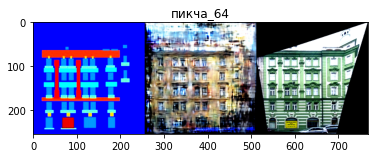

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


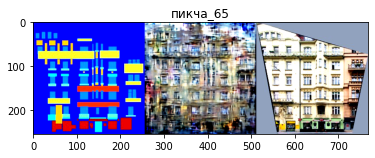

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


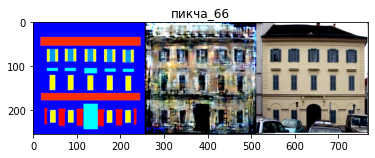

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


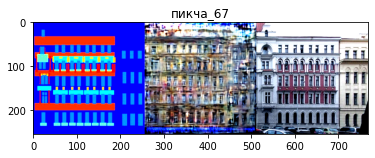

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


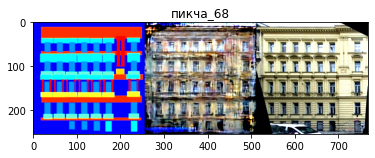

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


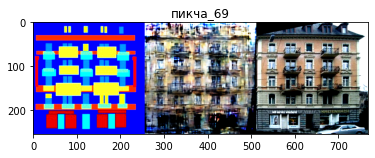

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


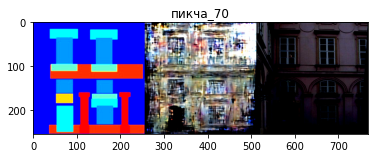

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


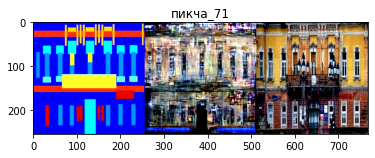

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


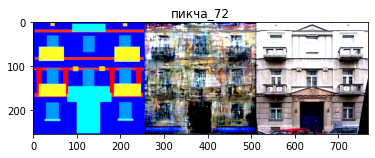

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


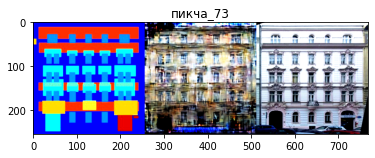

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


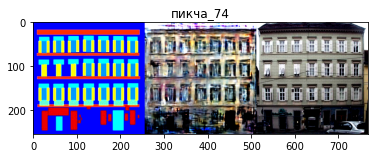

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


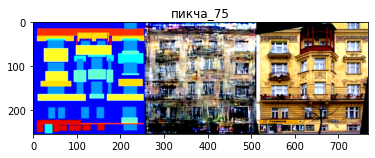

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


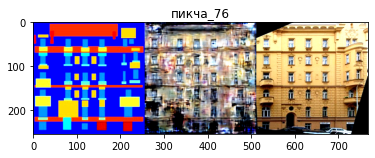

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


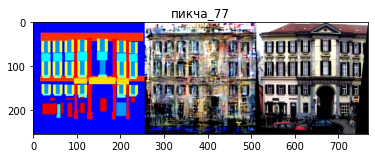

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


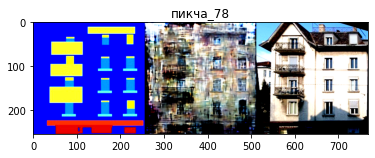

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


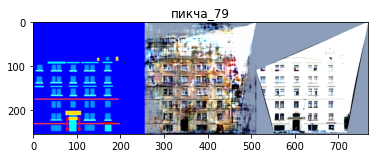

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


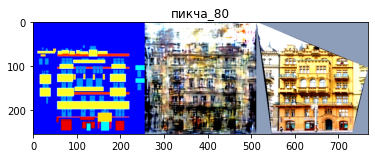

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


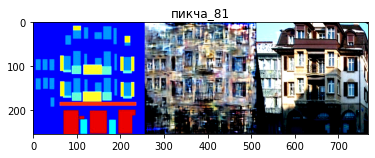

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


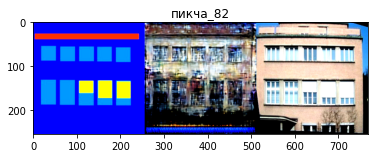

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


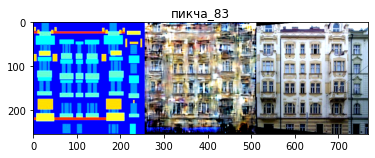

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


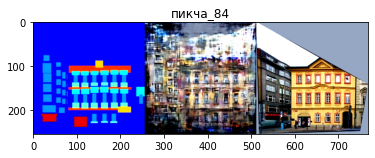

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


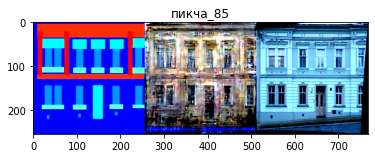

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


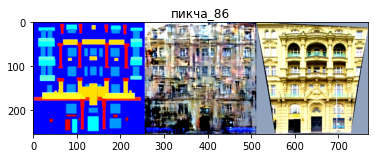

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


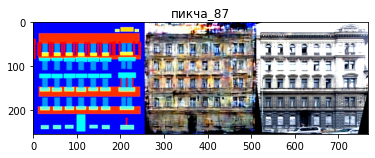

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


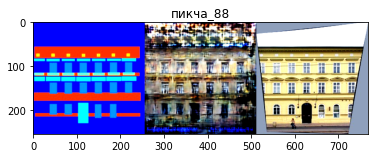

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


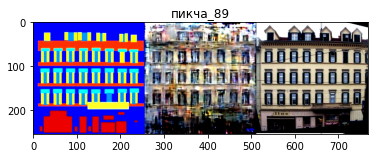

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


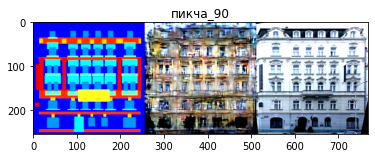

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


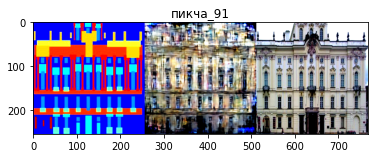

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


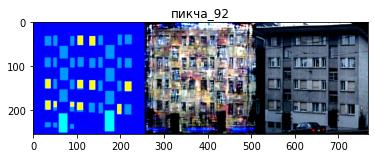

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


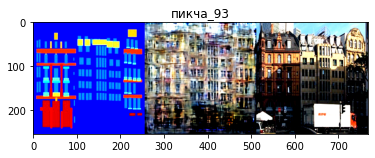

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


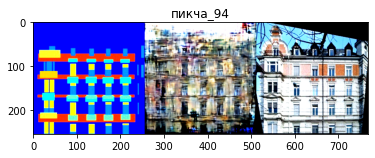

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


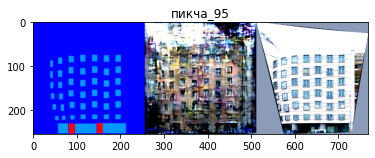

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


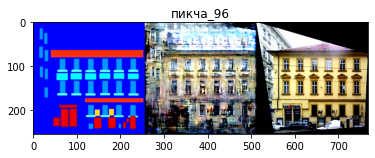

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


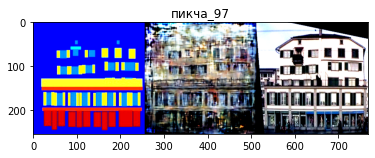

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


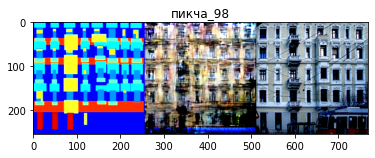

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


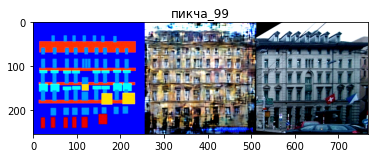

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


G.eval()
cnt = 0

for batch_1, batch_2 in loader_val:
  outlines = []
  target = []
  predict = []
  fake_2 = G(batch_1.cuda())
  outlines = batch_1
  target = batch_2
  predict = fake_2.cpu()

  for i in range(predict.shape[0]):
      concat_image = (torch.cat([outlines[i], predict[i], target[i]], dim=-1) + 1.) / 2.
      plt.title("пикча_" + str(cnt))
      plt.imshow(np.transpose(concat_image.detach().numpy(), (1,2,0)))
      plt.savefig('./res_pic_500/' + str(cnt) + '.png')
      cnt += 1
      plt.show()

In [ ]:
PATH = './drive/MyDrive/gan_l1/DL3model_299.pth'

checkpoint = torch.load(PATH)
G.load_state_dict(checkpoint['G'])
G_optimizer.load_state_dict(checkpoint['G_optim'])

D.load_state_dict(checkpoint['D'])
D_optimizer.load_state_dict(checkpoint['D_optim'])
epoch_start = checkpoint['epoch']

In [ ]:
class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

In [ ]:
unorm = UnNormalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))

### Результаты с отнормированной цветовой палитрой (маска, генерация модели, таргет):

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


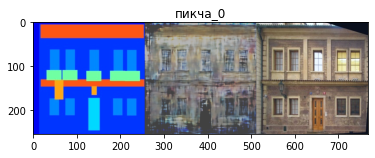

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


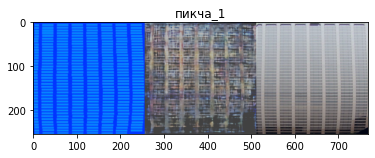

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


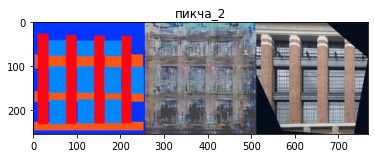

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


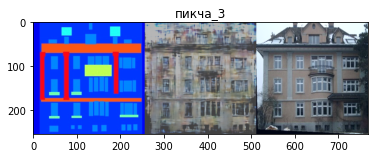

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


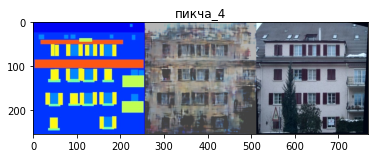

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


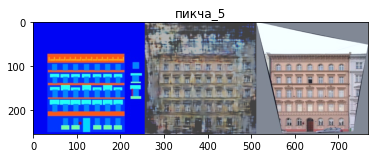

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


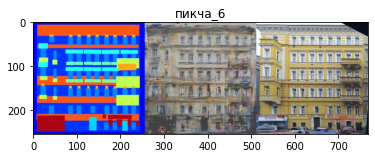

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


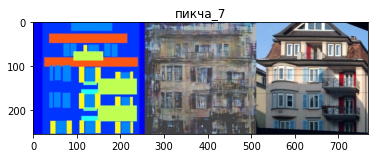

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


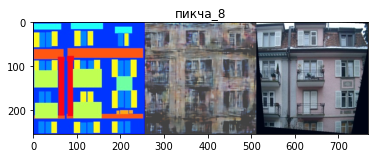

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


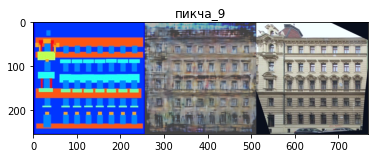

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


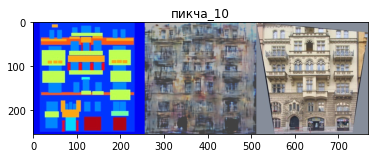

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


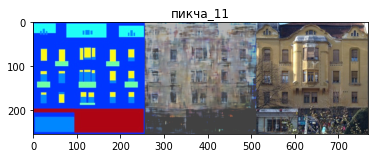

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


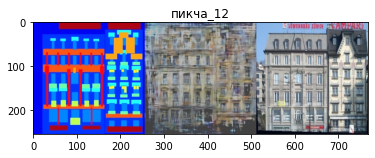

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


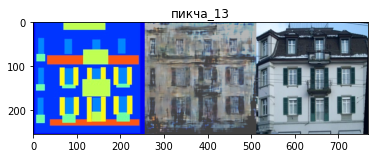

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


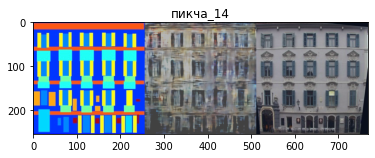

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


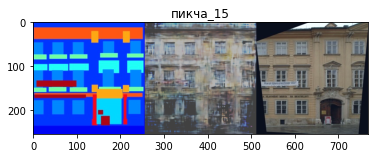

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


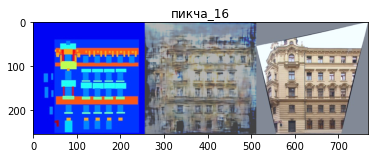

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


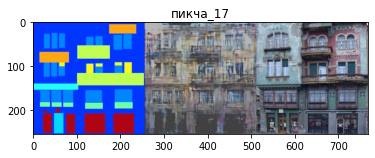

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


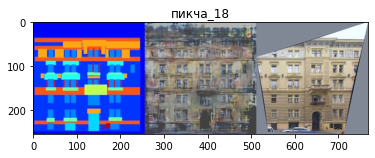

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


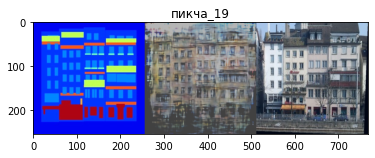

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


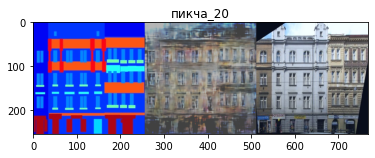

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


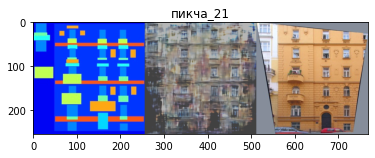

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


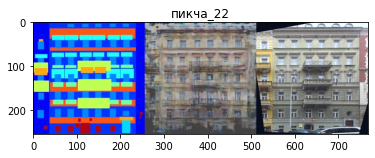

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


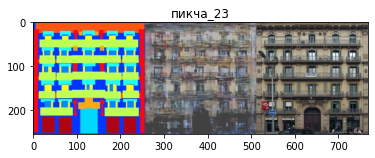

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


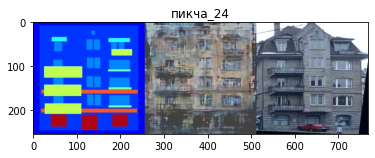

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


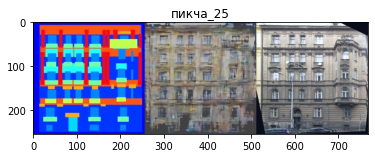

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


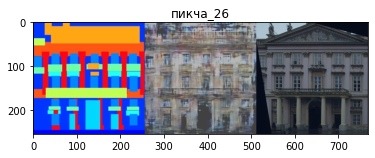

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


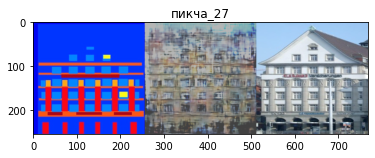

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


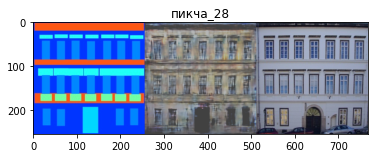

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


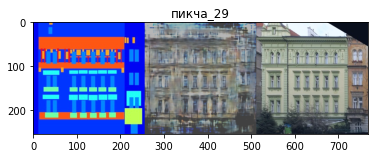

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


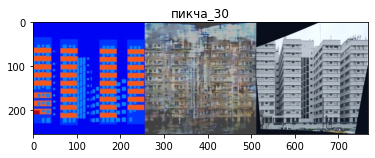

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


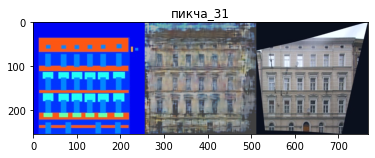

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


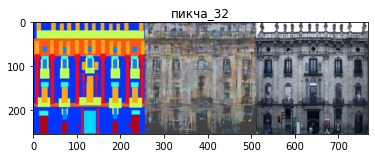

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


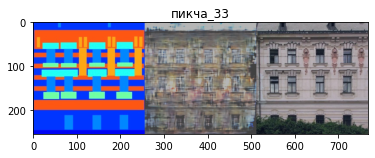

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


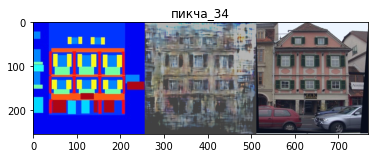

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


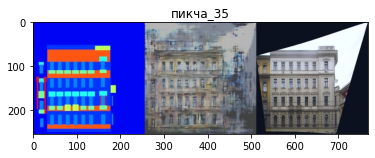

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


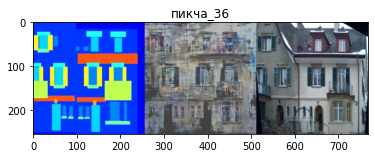

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


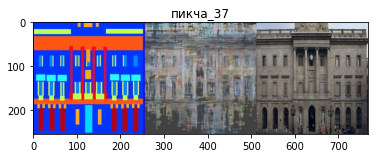

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


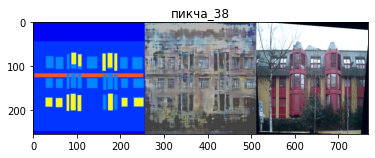

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


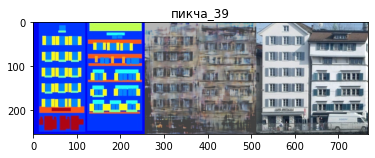

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


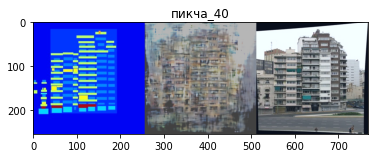

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


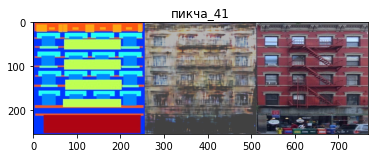

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


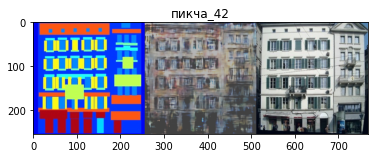

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


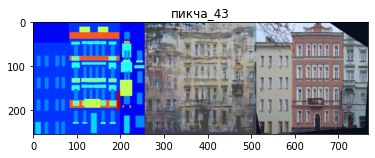

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


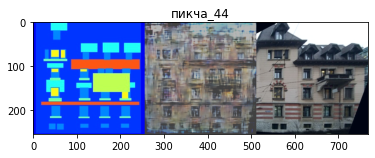

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


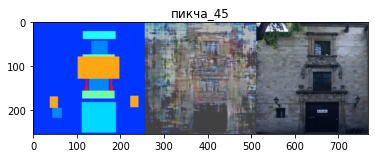

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


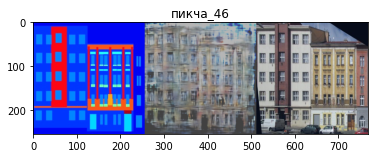

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


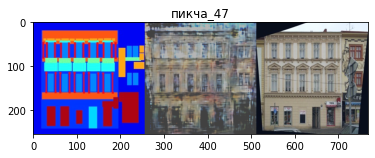

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


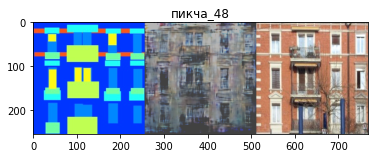

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


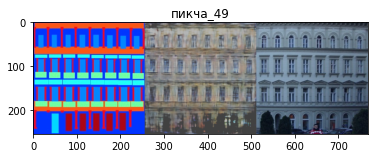

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


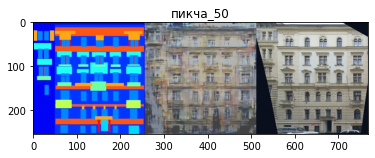

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


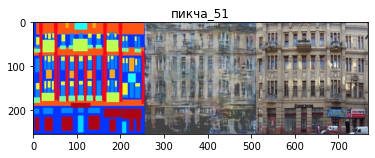

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


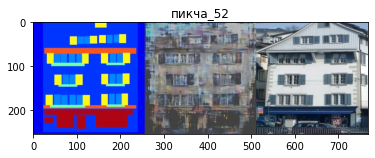

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


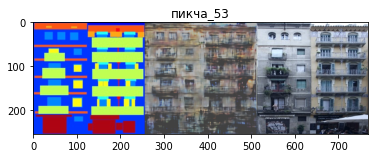

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


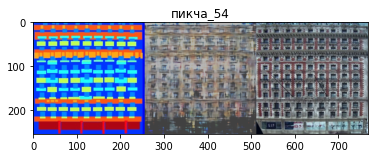

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


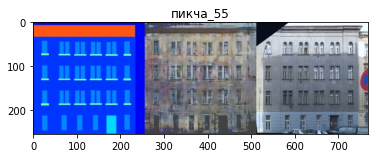

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


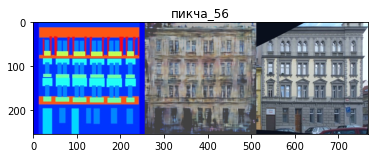

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


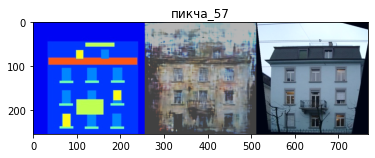

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


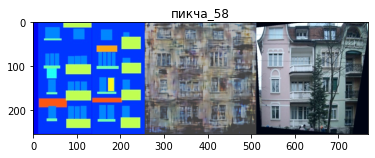

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


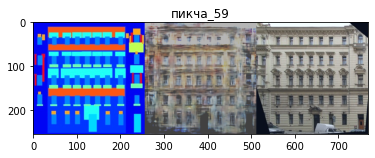

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


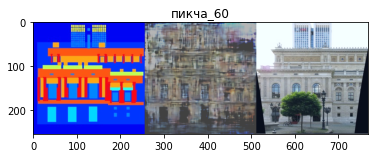

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


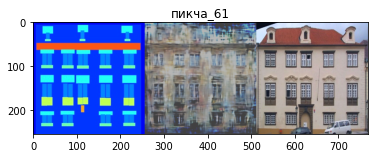

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


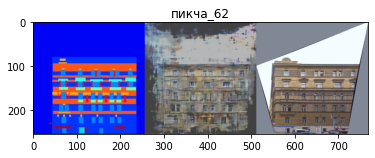

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


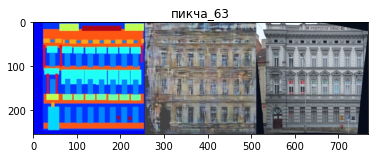

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


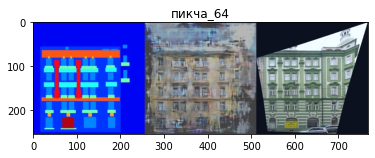

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


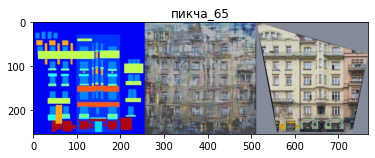

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


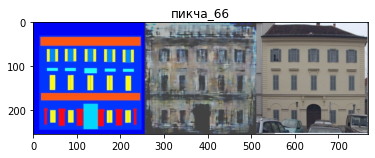

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


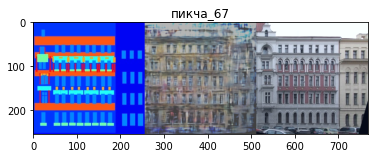

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


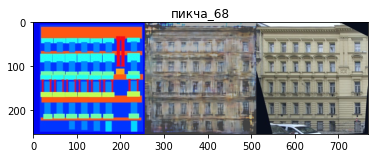

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


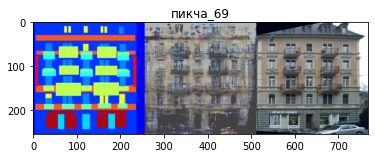

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


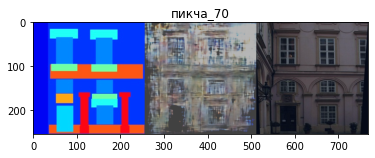

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


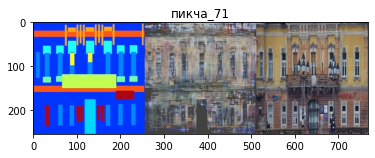

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


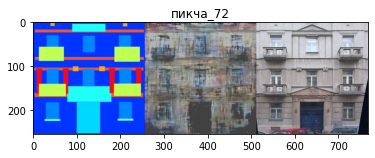

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


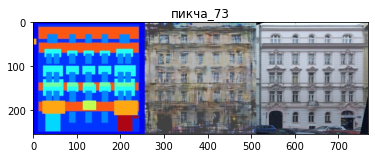

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


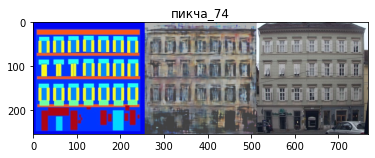

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


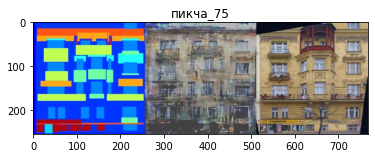

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


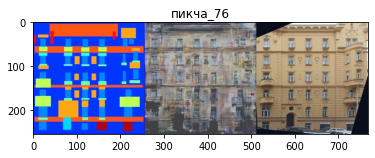

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


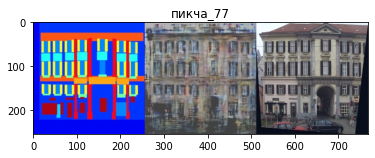

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


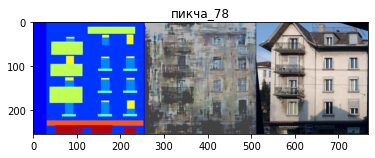

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


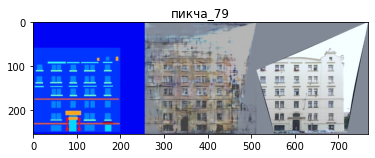

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


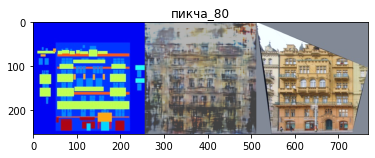

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


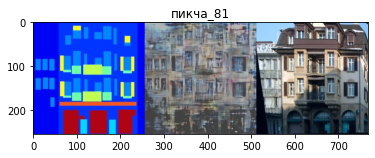

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


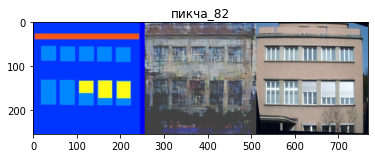

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


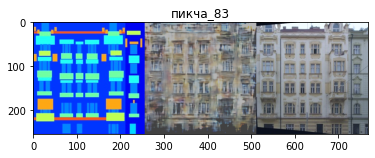

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


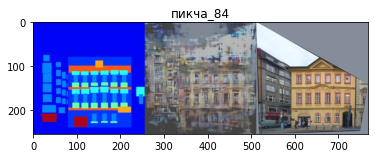

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


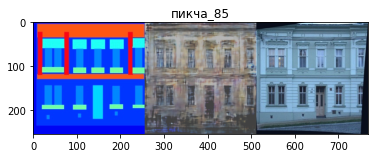

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


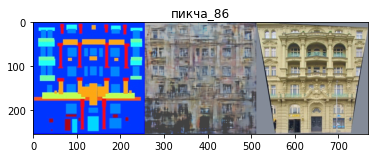

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


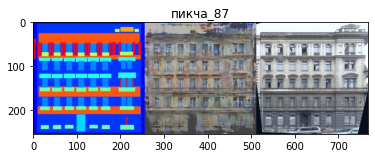

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


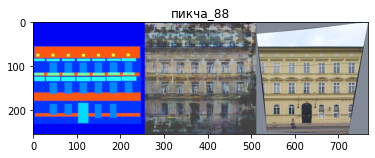

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


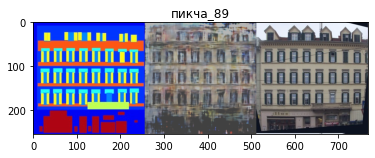

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


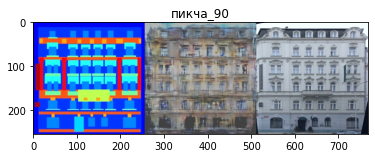

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


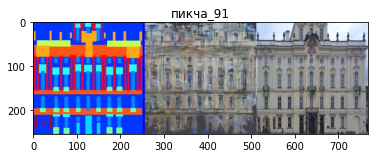

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


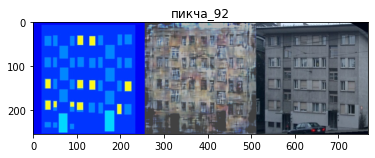

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


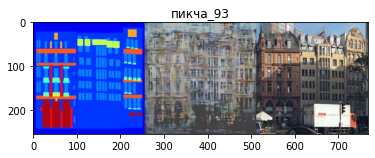

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


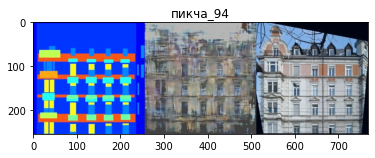

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


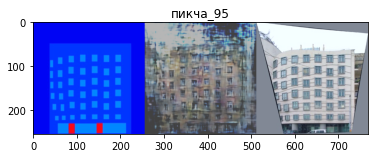

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


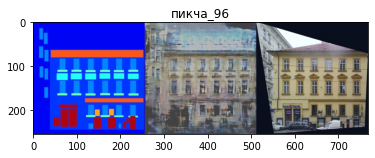

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


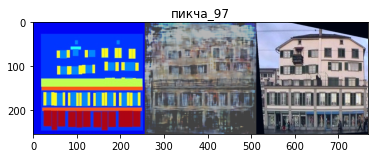

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


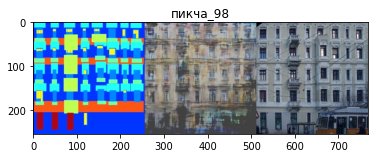

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


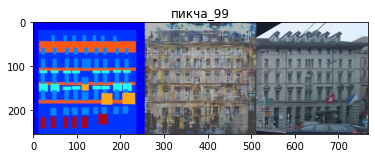

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

loader_val = data.DataLoader(data_set_val, batch_size=1, shuffle=False)
G.eval()
cnt = 0

for batch_1, batch_2 in loader_val:
  outlines = []
  target = []
  predict = []
  fake_2 = G(batch_1.cuda())
  outlines = unorm(batch_1)
  target = unorm(batch_2)
  predict = unorm(fake_2.cpu().detach())

  for i in range(predict.shape[0]):
      concat_image = (torch.cat([outlines[i], predict[i], target[i]], dim=-1))
      plt.title("пикча_" + str(cnt))
      plt.imshow(np.transpose(concat_image.detach().numpy(), (1,2,0)))
      plt.savefig('./res_pic_300/' + str(cnt) + '.png')
      cnt += 1
      plt.show()